# The advection equation
Numerical solution of the 1D advection problem
$$ \frac{\partial T}{\partial t} =  -c \frac{\partial T}{\partial x}$$ 
using an explicit forward in time, centred in space scheme

$T(x,t)$ represents the evolution of temperature distribution along the estuary over time

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

## User defined parameters

In [2]:
# problem parameters
c=0.5       # Advection speed [m s-1]
dx=200      # X resolution [m]
dt=200      # time step [s]
t0=0.       # initial time
tmax=0.1    # duration of simulation [days]
xmax=10.0e3 # length of the basin [m]

# Parameters of the initial temperature distribution
T0 = 15.        # baseline temperature [degC]
sigma = 2000.   # width at half amplitude [m]
A = 5.          # amplitude [degC]

## Initial function and grid specifications
The initial shape of the temperature distribution is a Gaussian peak function

In [3]:
# Spatial shape of the temperature disturbance
def Gaussian(x):
    y = T0+A*np.exp(-(x/sigma)**2)
    return y

The resulting space-time grid depends on the parameters above

In [4]:
# time axis
NT = int(np.floor(tmax*86400/dt))+1  # number of steps (starts from 0)
# X axis (centred at 0)
x = np.arange(-xmax,xmax,dx)
IM = len(x)             # number of grid points
T = np.zeros([IM,NT])     # the array holding the numerical solution 
print('Grid steps : ',IM)
print('Number of time steps : ',NT)
print('Timestep = ',dt,' s')
print('Max numerical speed DX/DT = ',dx/dt,' m/s')
print('Physical speed = ',c,' m/s')
print('Courant number = ',c*dt/dx)

Grid steps :  100
Number of time steps :  44
Timestep =  200  s
Max numerical speed DX/DT =  1.0  m/s
Physical speed =  0.5  m/s
Courant number =  0.5


## Numerical solution
Note that this code stores the solution at all times in array T for educational purposes. This allows to plot the solution at the different time steps and see how it evolves.

*This method is very inefficient for any application because it uses a lot of memory. In modern computer codes only a few time records are hold in memory. The instantaneous solution is often temporarely stored for computing time averages and then discarded.*

This part of the code is the topic of some questions found in the lecture notes

In [5]:
# Compute the numerical solution using a time loop over the number of time steps
T[:,0] = Gaussian(x)    # initial condition

for n in range(NT-1):
    # Question 1
    T[0,n+1]  = T0
    T[-1,n+1] = T0
    # Question 2 and Question 3
    rhs = -c*(T[2:,n]-T[:-2,n])/(2.*dx) # L1
    T[1:-1,n+1] = T[1:-1,n] + rhs*dt    # L2

## Question 1

They set the boundary conditions
- The first line sets the left boundary of the domain to the background temperature.
- The second line sets the right boundary of the domain to the background temperature.

## Question 2

- Line L1 calculates the right-hand side of the advection equation, it implements the right-hand side advection term of the numerical scheme.
- Line L2 updates the temperature from time level n to time level n+1.

## Question 3

Because the model only updates the interior grid points

- At the first grid point, there is no i−1.
- At the last grid point, there is no i+1.

## Plot the result using a matplotlib animation
The animation below displays the evolution of the solution and compares it with the analytical solution

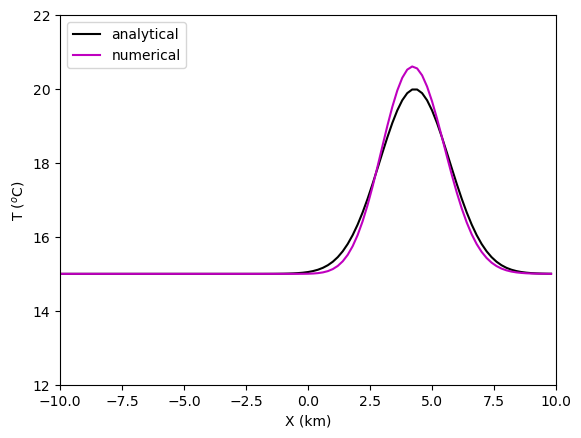

In [6]:
fig, ax = plt.subplots()
# set the axis limits
plt.axis([-xmax/1000, xmax/1000, T0-3, T0+7])
# first plot the initial conditions and set the line attributes
line, = ax.plot(x/1000., Gaussian(x),'k',label='analytical')
sol, = ax.plot(x/1000., T[:,0],'m',label='numerical')
ax.set_xlabel('X (km)')
ax.set_ylabel('T ($^o$C)')
plt.legend(loc='upper left')

def animate(i):
    t = t0 + i*dt
    line.set_ydata(Gaussian(x-c*t))  # update the analytical solution
    sol.set_ydata(T[:,i])  # update the numerical solution
    return line,sol,

# create the animation and loop (interval is in ms)
ani = animation.FuncAnimation(
    fig, animate, interval=dt, blit=True, frames=NT, repeat=True)

# To save the animation, use e.g.
# ani.save("movie.mp4")
# or
# writer = animation.FFMpegWriter(
#     fps=15, metadata=dict(artist='Me'), bitrate=1800)
# ani.save("movie.mp4", writer=writer)

# display the animation as a javascript object embedded in the notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

## Question 4

The numerical solution changes as it moves, it starts narrowing and becoming longer while the analyitical remains the same throughout.

could be because the Courant number is too large, so it causes instabilities.

## Question 5

In [26]:
from IPython.display import HTML

def run_advection_experiment(c=0.5, dx=200, dt=200, sigma=2000,
                             tmax=0.1, xmax=10.0e3, T0=15., A=5.,
                             title='Advection experiment'):

    # number of time steps
    NT = int(np.floor(tmax*86400/dt)) + 1

    # space grid
    x = np.arange(-xmax, xmax, dx)
    IM = len(x)

    # temperature array
    T = np.zeros([IM, NT])

    # Gaussian initial condition
    def Gaussian(x):
        return T0 + A*np.exp(-(x/sigma)**2)

    # initial condition
    T[:, 0] = Gaussian(x)

    # numerical solution
    for n in range(NT-1):
        T[0, n+1] = T0
        T[-1, n+1] = T0

        rhs = -c*(T[2:, n] - T[:-2, n])/(2.*dx)
        T[1:-1, n+1] = T[1:-1, n] + rhs*dt

    # print experiment information
    print('dx =', dx, 'm')
    print('dt =', dt, 's')
    print('c =', c, 'm/s')
    print('Courant number =', c*dt/dx)
    print('Grid points =', IM)
    print('Time steps =', NT)

    # animation
    fig, ax = plt.subplots(figsize=(7, 4))

    ax.axis([-xmax/1000, xmax/1000, T0-3, T0+7])

    analytical, = ax.plot(x/1000, Gaussian(x), 'k', label='analytical')
    numerical, = ax.plot(x/1000, T[:, 0], 'm', label='numerical')

    ax.set_xlabel('X (km)')
    ax.set_ylabel('T ($^o$C)')
    ax.set_title(title)
    ax.legend(loc='upper left')

    def animate(i):
        time = i*dt
        analytical.set_ydata(Gaussian(x - c*time))
        numerical.set_ydata(T[:, i])
        return analytical, numerical

    ani = animation.FuncAnimation(
        fig, animate, frames=NT, interval=100, blit=True, repeat=True
    )

    plt.close(fig)

    return HTML(ani.to_jshtml())

In [27]:
run_advection_experiment(dx=100, dt=200, c=0.5,
                         title='Halved dx: Courant number = 1')

dx = 100 m
dt = 200 s
c = 0.5 m/s
Courant number = 1.0
Grid points = 200
Time steps = 44


In [28]:
run_advection_experiment(dx=500, dt=100, c=0.5,
                         title='dx = 500 m, dt = 100 s: Courant number = 0.1')

dx = 500 m
dt = 100 s
c = 0.5 m/s
Courant number = 0.1
Grid points = 40
Time steps = 87


## When dx is halved to 100 m, C=1. 
- The grid resolution improves because there are more grid points, but the Courant number also increases so the numerical solution is still less stable.

## When dx=500 m and dt=100 s, C=0.1. 
- The Courant number is smaller, so the time stepping is more stable, but the grid spacing is larger, so the temperature peak looks less well resolved.

## Question 6

In [29]:
run_advection_experiment(dx=200, dt=200, c=0.5, sigma=1000,
                         title='Smaller sigma: sigma = 1000 m')

dx = 200 m
dt = 200 s
c = 0.5 m/s
Courant number = 0.5
Grid points = 100
Time steps = 44


In [30]:
run_advection_experiment(dx=100, dt=100, c=0.5, sigma=1000,
                         title='Smaller sigma with finer grid: dx = 100 m, dt = 100 s')

dx = 100 m
dt = 100 s
c = 0.5 m/s
Courant number = 0.5
Grid points = 200
Time steps = 87


In [31]:
run_advection_experiment(dx=200, dt=200, c=1.0, sigma=2000,
                         title='Double current speed: c = 1.0 m/s')

dx = 200 m
dt = 200 s
c = 1.0 m/s
Courant number = 1.0
Grid points = 100
Time steps = 44


In [32]:
run_advection_experiment(dx=200, dt=100, c=1.0, sigma=2000,
                         title='Double current speed with smaller dt: c = 1.0 m/s, dt = 100 s')

dx = 200 m
dt = 100 s
c = 1.0 m/s
Courant number = 0.5
Grid points = 100
Time steps = 87


- when I changed sigma from 2000 m to 1000 m, the temperature peak became narrower and steeper, sigma seem to controls the width of the shape.

- Because the peak is sharper, the model needs a smaller dx to capture it properly. If dx is too large, there are not enough grid points across the peak, so the numerical solution lookod rougher.

- When I doubled the current speed from c=0.5 m/s to c=1.0 m/s, the disturbance moved faster.

- a smaller sigma needs a finer grid, and a larger c needs a smaller time step.